# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = './train.p'
testing_file = './test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
import pandas as pd
import numpy as np

y_train_df = pd.DataFrame(y_train)
y_train_df.columns=['id']
y_test_df = pd.DataFrame(y_test)
y_test_df.columns=['id']

# found data here https://github.com/domluna/traffic-signs/blob/master/signnames.csv
signnames_file = './signnames.csv'
signnames_df = pd.read_csv(signnames_file)
signnames_df.columns=['id','sign_name']

In [3]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = X_train.data.shape[0]

# TODO: Number of testing examples.
n_test = X_test.data.shape[0]

# TODO: What's the shape of an traffic sign image?
image_shape = [X_train.data.shape[1], X_train.data.shape[2], X_train.data.shape[3]]

# TODO: How many unique classes/labels there are in the dataset.

n_classes = len(pd.concat([y_train_df,y_test_df])['id'].unique())

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 34799
Number of testing examples = 12630
Image data shape = [32, 32, 3]
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [4]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline
import cv2

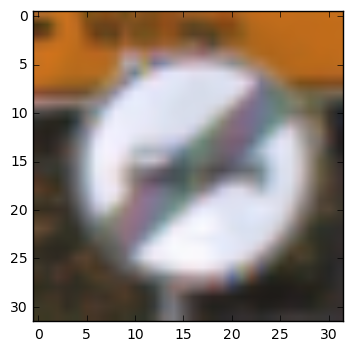

In [5]:
img=X_train[140]
plt.imshow(img)

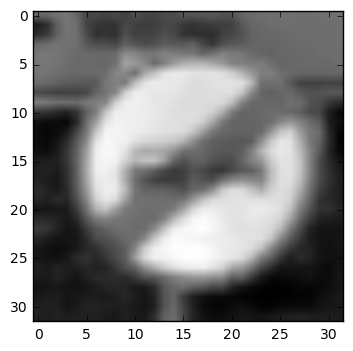

In [6]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #grayscale conversion
plt.imshow(gray, cmap='gray')

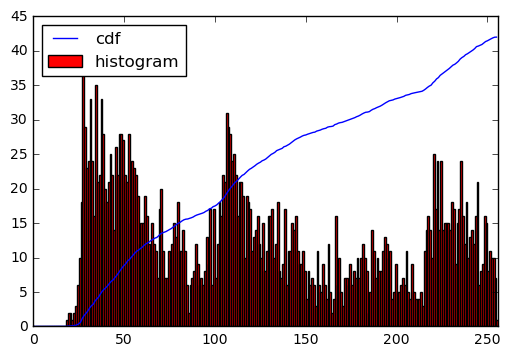

In [7]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

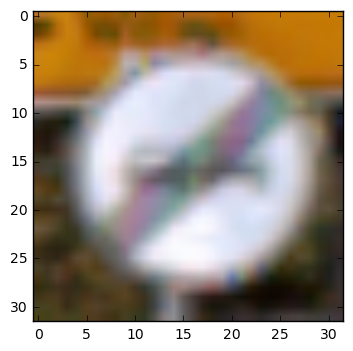

In [8]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
plt.imshow(cdf[img])

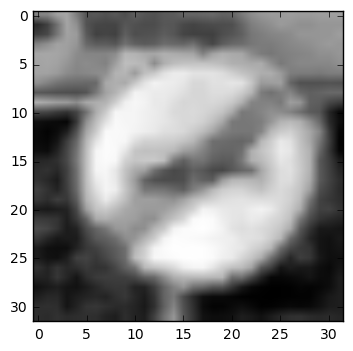

In [9]:
plt.imshow(cv2.equalizeHist(gray),cmap='gray')

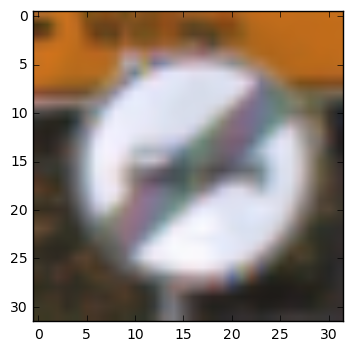

In [10]:
cdf_img=img
cv2.normalize(cdf_img, cdf_img, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.imshow(cdf_img)

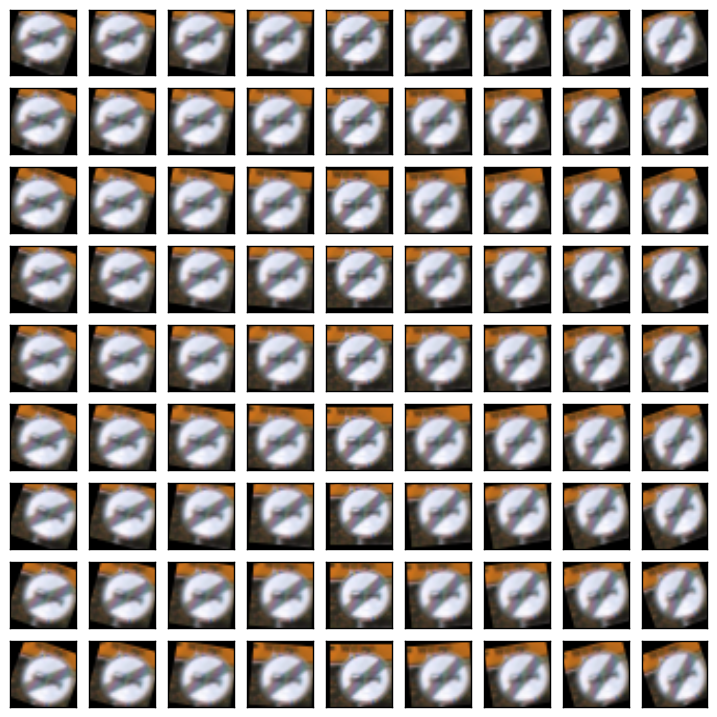

In [11]:
def jitter_image_test(img):
    cols,rows=32,32
    degrees=[-20,-15,-10,-5,0,5,10,15,20]
    Ms=[cv2.getRotationMatrix2D((cols/2,rows/2),d,1) for d in degrees]
    #print(Ms[0])
    positions=np.float32([[[1,0,r[0]],[0,1,r[1]]] for r in np.subtract(np.indices((3,3)).reshape(2,-1).T*2,[2,2])])
    pos_no=len(positions)
    img_no=len(degrees)
    fig = plt.figure(figsize=(pos_no, img_no), dpi=100)
    for p in range(len(positions)):
        for i in range(img_no):
            plt.subplot(len(positions), img_no, (p*img_no)+i+1)
#             plt.imshow(cv2.warpAffine(img,np.add(Ms[i],positions[p]),(cols,rows)),cmap='gray')
            jimg=cv2.warpAffine(img,positions[p],(cols,rows))
            jimg=cv2.warpAffine(jimg,Ms[i],(cols,rows))
            plt.imshow(jimg)
            plt.xticks([]), plt.yticks([])
    plt.show()
jitter_image_test(img)

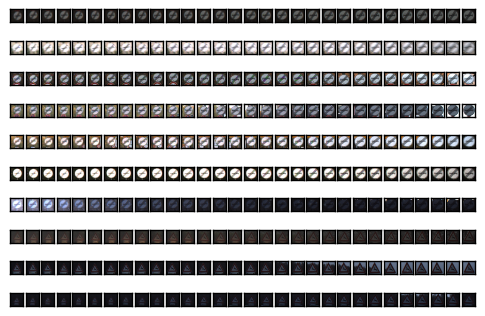

In [12]:
nosigns=10
imgpersign=30
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train[i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [13]:
join_df=y_train_df.join(signnames_df,on=['id'],rsuffix='_sign')
join_df.axes

[RangeIndex(start=0, stop=34799, step=1),
 Index(['id', 'id_sign', 'sign_name'], dtype='object')]

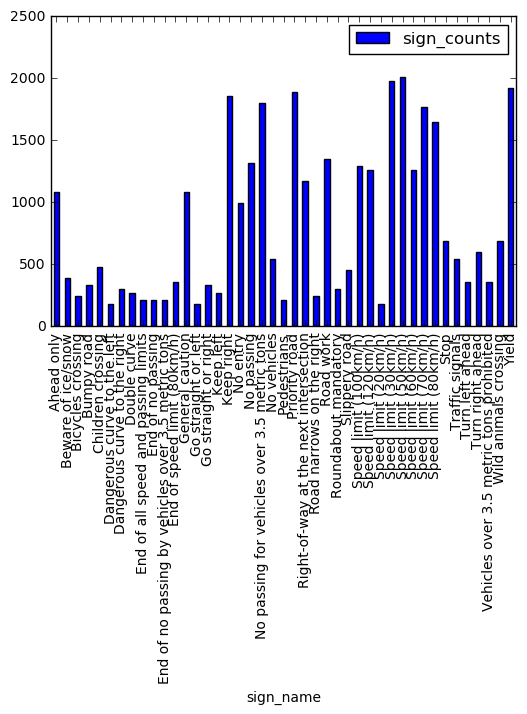

In [14]:
counts_df= pd.DataFrame(join_df.groupby('sign_name').size().rename('sign_counts'))
counts_df.plot.bar()

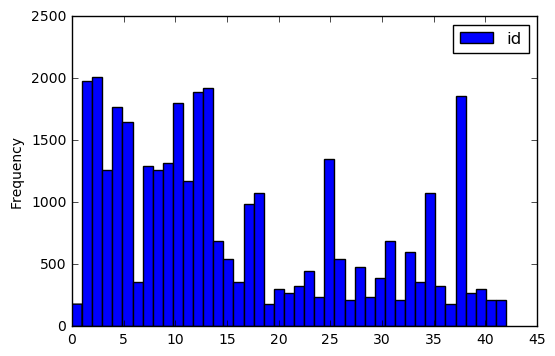

In [15]:
y_train_df.plot.hist(bins=n_classes)

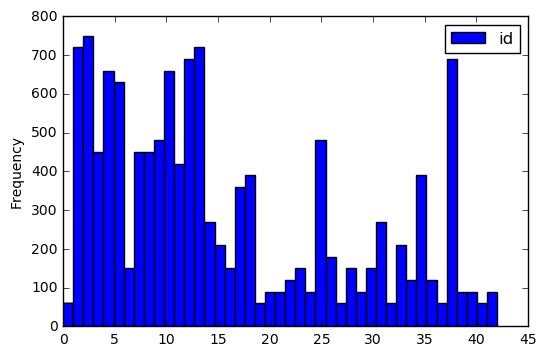

In [16]:
y_test_df.plot.hist(bins=n_classes)

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [17]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.

def normalize(image):
    dest=np.empty(image.shape,dtype=np.float32)
    cv2.normalize(image, dest, alpha=0.1, beta=0.9, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return dest

In [18]:
def yuv_normalized(images):
    
    def equalize_and_normalise(image):    
        yuv=cv2.split(cv2.cvtColor(image, cv2.COLOR_RGB2YUV))
        yuv[0]=cv2.equalizeHist(yuv[0])

        norm=normalize(cv2.cvtColor(cv2.merge(yuv), cv2.COLOR_YUV2RGB))
        return norm
        
    converted_images = np.array([equalize_and_normalise(img) for img in images])

    return converted_images

X_train_yuv = yuv_normalized(X_train)
X_test_yuv = yuv_normalized(X_test)

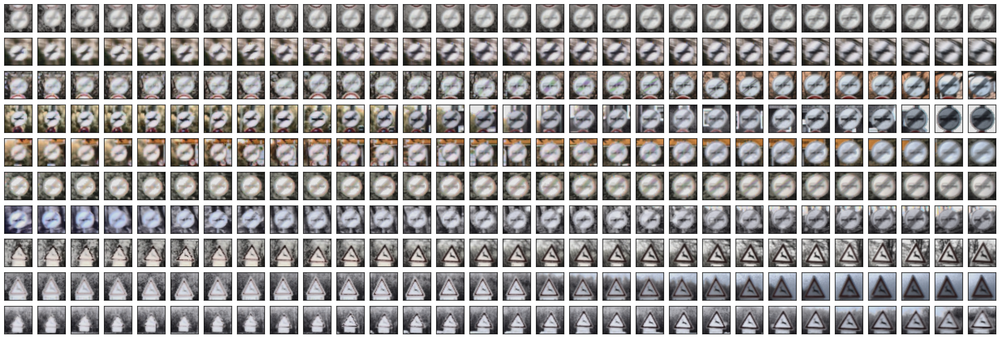

In [19]:
# images equalized and normalized
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train_yuv[i],)
    plt.xticks([]), plt.yticks([])
plt.show()

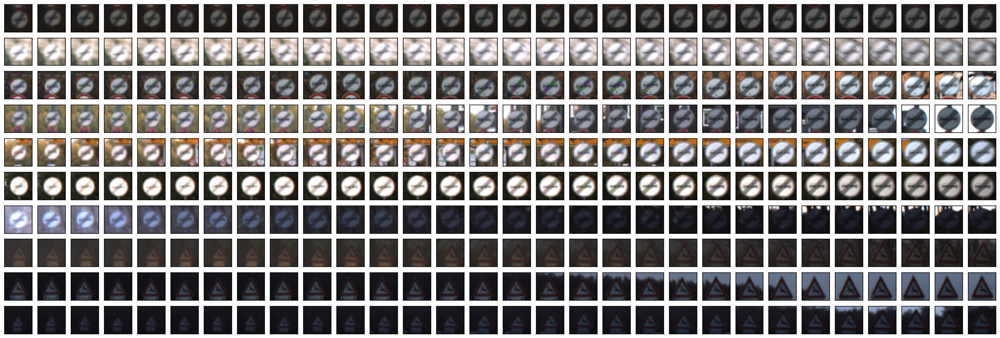

In [20]:
# images with no filtering
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train[i])
    plt.xticks([]), plt.yticks([])
plt.show()

id: 0 count: 180
id: 1 count: 1980
id: 2 count: 2010
id: 3 count: 1260
id: 4 count: 1770
id: 5 count: 1650
id: 6 count: 360
id: 7 count: 1290
id: 8 count: 1260
id: 9 count: 1320
id: 10 count: 1800
id: 11 count: 1170
id: 12 count: 1890
id: 13 count: 1920
id: 14 count: 690
id: 15 count: 540
id: 16 count: 360
id: 17 count: 990
id: 18 count: 1080
id: 19 count: 180
id: 20 count: 300
id: 21 count: 270
id: 22 count: 330
id: 23 count: 450
id: 24 count: 240
id: 25 count: 1350
id: 26 count: 540
id: 27 count: 210
id: 28 count: 480
id: 29 count: 240
id: 30 count: 390
id: 31 count: 690
id: 32 count: 210
id: 33 count: 599
id: 34 count: 360
id: 35 count: 1080
id: 36 count: 330
id: 37 count: 180
id: 38 count: 1860
id: 39 count: 270
id: 40 count: 300
id: 41 count: 210
id: 42 count: 210
132749 132749


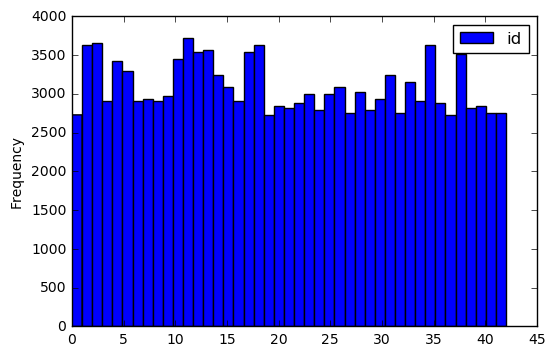

In [21]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

import random

X_jittered = []
y_jittered =[]
cols,rows=32,32
     
def append(X,y):
    X_jittered.append(X)
    y_jittered.append(y)

def append_as_is(X,y,id):
    for index in y_train_df[y_train_df.id==id].index.tolist():
        append(X[index],y[index])
            
def jittered_data(X, y, id, count, img_total, rotations_M, positions_M):
    IMG_PER_BATCH = 30
    img_required_count = img_total - count
    
    existing_batches=count // IMG_PER_BATCH
    
    id_index=y_train_df[y_train_df.id==id].index.tolist()
    b_id = 0
    while img_required_count > 0:
        # find a new batch every IMG_PER_BATCH counf
        if img_required_count % IMG_PER_BATCH == 0:
            b_id=random.randrange(existing_batches-1)
        b_img=img_required_count % IMG_PER_BATCH
        img_id = id_index[b_id*IMG_PER_BATCH+b_img]
        
        jimg=X[img_id]
        # pick a random matrix number
        r_M=rotations_M[random.randrange(len(rotations_M))]
        jimg=cv2.warpAffine(jimg,r_M,(cols,rows))
        
        # now perturb placement randomly
        p_M=positions_M[random.randrange(len(positions_M))]
        jimg=cv2.warpAffine(jimg,p_M,(cols,rows))
        
        append(jimg,y[img_id])
        img_required_count -= 1
        
def gen_additional_data(X,y):    
    
    # setup the image rotation matrices
    degrees=[-20,-15,-10,-5,5,10,15,20]
    rotations_M=[cv2.getRotationMatrix2D((cols/2,rows/2),d,1) for d in degrees]
    
    positions_M=np.float32([[[1,0,r[0]],[0,1,r[1]]] for r in np.subtract(np.indices((3,3)).reshape(2,-1).T*2,[2,2])])
   
    for id, count in y_train_df.groupby('id').size().rename('sign_counts').iteritems():
        print("id: %d count: %d" %(id, count))

        # append the data as is
        append_as_is(X,y,id)

        #  if we dont have enough images jitter the data to create more
        if count < 1250:
            img_total=count+(85*30)

            jittered_data(X, y, id, count, img_total, rotations_M, positions_M)
        else:
            img_total=count+(55*30)

            jittered_data(X, y, id, count, img_total, rotations_M, positions_M)

# gen_additional_data(X_train,y_train_1hot)
gen_additional_data(X_train_yuv,y_train)
assert len(X_jittered) == len(y_jittered)        
print (len(X_jittered),len(y_jittered))


y_jittered_df = pd.DataFrame(y_jittered)
y_jittered_df.columns=['id']
y_jittered_df.plot.hist(bins=n_classes)



In [22]:
signnames_df

,id,sign_name
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)
5,5,Speed limit (80km/h)
6,6,End of speed limit (80km/h)
7,7,Speed limit (100km/h)
8,8,Speed limit (120km/h)
9,9,No passing


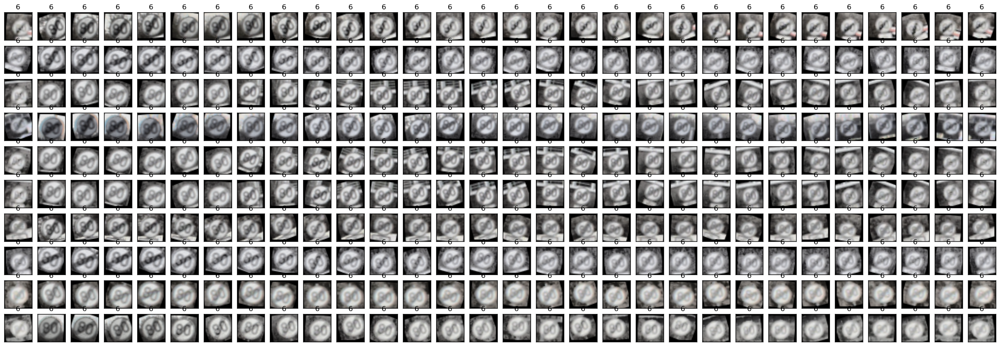

In [23]:
# display a random batch of 10 signs
#jittered_names_df=y_jittered_df.join(signnames_df,on=['id'],rsuffix='_sign')
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
startindex = random.randrange(len(X_jittered)//imgpersign-nosigns)*imgpersign
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.title(y_jittered_df.iloc[startindex + i].id)
    plt.imshow(X_jittered[startindex + i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [24]:
def batch(inputs, targets, batchsize):
    assert len(inputs) == len(targets)
    for start_idx in range(0, len(inputs), batchsize):
        batch_slice = slice(start_idx, start_idx + batchsize)
        yield inputs[batch_slice], targets[batch_slice]

In [25]:
import random
from sklearn.model_selection import train_test_split
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_jittered, y_jittered, test_size=0.10, random_state=74723)

assert len(X_train_split) == len(y_train_split)
assert len(X_val_split) == len(y_val_split)

print("Number of training examples =", len(X_train_split))
print("Number of validation examples =", len(X_val_split))
print("Number of testing examples =", len(X_test))


Number of training examples = 119474
Number of validation examples = 13275
Number of testing examples = 12630


In [26]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

In [27]:
import tensorflow as tf
from tensorflow.contrib.layers import flatten
import os
print(tf.__version__)

0.12.1


In [28]:
# using https://www.tensorflow.org/how_tos/summaries_and_tensorboard/#launching_tensorboard
def variable_summaries(var):
    """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)

def nn_layer(input_tensor, W, b, layer_name, act=tf.nn.relu):
    """Reusable code for making a simple neural net layer.

    It does a matrix multiply, bias add, and then uses relu to nonlinearize.
    It also sets up name scoping so that the resultant graph is easy to read,
    and adds a number of summary ops.
    """
    # Adding a name scope ensures logical grouping of the layers in the graph.
    with tf.name_scope(layer_name):
        # This Variable will hold the state of the weights for the layer
        with tf.name_scope('weights'):
            variable_summaries(W)
        with tf.name_scope('biases'):
            variable_summaries(b)
        with tf.name_scope('Wx_plus_b'):
            preactivate = tf.matmul(input_tensor, W) + b
            tf.summary.histogram('pre_activations', preactivate)
        activations = act(preactivate, name='activation')
        tf.summary.histogram('activations', activations)
        return activations

In [29]:
def conv2d(x, W, b, layer_name='conv1', strides=1):
    # Conv2D wrapper, with bias and relu activation
    with tf.name_scope(layer_name):
        tf.summary.scalar('strides', strides)
        with tf.name_scope('weights'):
            variable_summaries(W)
        with tf.name_scope('biases'):
            variable_summaries(b)
        with tf.name_scope('conv2d_plus_b'):
            conv = tf.nn.conv2d(x, W, strides=[1, strides, strides, 1], padding='VALID') + b
            tf.summary.histogram('pre_activations',conv)
        x = tf.nn.relu(conv)
        tf.summary.histogram('activations', x)
        return x
    
def maxpool2d(x, layer_name='maxpool1', k=2):
    with tf.name_scope(layer_name):
        tf.summary.scalar('k', k)
        with tf.name_scope('max_pool'):
            x = tf.nn.max_pool(
                x,
                ksize=[1, k, k, 1],
                strides=[1, k, k, 1],
                padding='VALID')
            tf.summary.histogram('post_max_pool', x)
            return x

def conv_net(x, weights, biases, keep_prob):

    print("shape ", x)
    with tf.name_scope('input'):
        tf.summary.image('input', x, 100) 
       
    # Convolution Layer
    conv1 = conv2d(x, weights['wc1'], biases['bc1'], 'conv1', strides=1)
    print("conv1 shape ", conv1)
    
    # Max Pooling (down-sampling)
    conv1 = maxpool2d(conv1, 'maxpool1', k=2)
    print("conv1 after maxpool shape ", conv1)
    
    # Convolution Layer
    conv2 = conv2d(conv1, weights['wc2'], biases['bc2'], 'conv2', strides=1)
    print("conv2 shape ", conv2)
        
    # Max Pooling (down-sampling)
    conv2 = maxpool2d(conv2, 'maxpool2', k=2)
    print("conv2 after maxpool shape ", conv2)
    
    
    # Reshape conv1 output to fit fully connected layer input
    with tf.name_scope('flatten'):
        flat1 = flatten(conv2) 
    print("flat1 shape", flat1)
    
    # Fully connected layer
    fc1 = nn_layer(flat1, weights['wd1'], biases['bd1'],'fc1')
    print("fc1 shape", fc1)
    
    # Fully connected layer
    fc2 = nn_layer(fc1, weights['wd2'], biases['bd2'],'fc2')
    print("fc2 shape", fc2)
    
    # Apply Dropout
    with tf.name_scope('dropout'):    
        tf.summary.scalar('dropout_keep_probability', keep_prob)
        dropped = tf.nn.dropout(fc2, keep_prob)

    # Output, class prediction
    out = nn_layer(dropped, weights['out'], biases['out'], 'out', act=tf.identity)
    
    print("out shape ", out)
    return out

In [30]:
# Hyperparameters
mu = 0
sigma = 0.1

def weight_variable(shape):
    w = tf.truncated_normal(shape, mean = mu, stddev = sigma)
    return tf.Variable(w, name='weights')

def bias_variable(shape):
    b = tf.zeros(shape=shape)
    return tf.Variable(b, name='biases')

# Store layers weight & bias
weights = {
    'wc1': weight_variable([5, 5, 3, 12]),
    'wc2': weight_variable([5, 5, 12, 32]),
    'wd1': weight_variable([5*5*32, 240]),
    'wd2': weight_variable([240, 168]),
    'out': weight_variable([168, n_classes])
}

biases = {
    'bc1': bias_variable([12]),
    'bc2': bias_variable([32]),
    'bd1': bias_variable([240]),
    'bd2': bias_variable([168]),
    'out': bias_variable([n_classes])
}

with tf.name_scope('input'):
    #  consists of 32x32x3, color images
    x = tf.placeholder(tf.float32, (None,32,32,3), name='x-input')
    # Classify over 43 unique label classes
    y = tf.placeholder(tf.float32, (None, n_classes), name='y-input')

keep_prob = tf.placeholder(tf.float32, name='keep-prob') #dropout (keep probability)

# Construct the model
logits = conv_net(x, weights, biases, keep_prob)

   
with tf.name_scope('cross_entropy'):
    # Define loss and optimizer
    cross_entropy = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits, y))
    #cross_entropy = tf.reduce_mean(-tf.reduce_sum(y * tf.log(prediction + 1e-6), reduction_indices=1))
    with tf.name_scope('total'):
        cross_entropy = tf.reduce_mean(cross_entropy)
tf.summary.scalar('cross_entropy', cross_entropy)

learning_rate = 0.001

with tf.name_scope('train'):
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cross_entropy)
    
with tf.name_scope('accuracy'):
    with tf.name_scope('correct_prediction'):
        #correct_prediction = tf.equal(tf.argmax(out, 1), tf.argmax(y, 1))
        correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(y, 1))
    with tf.name_scope('accuracy'):    
        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
tf.summary.scalar('accuracy', accuracy)

shape  Tensor("input/x-input:0", shape=(?, 32, 32, 3), dtype=float32)
conv1 shape  Tensor("conv1/Relu:0", shape=(?, 28, 28, 12), dtype=float32)
conv1 after maxpool shape  Tensor("maxpool1/max_pool/MaxPool:0", shape=(?, 14, 14, 12), dtype=float32)
conv2 shape  Tensor("conv2/Relu:0", shape=(?, 10, 10, 32), dtype=float32)
conv2 after maxpool shape  Tensor("maxpool2/max_pool/MaxPool:0", shape=(?, 5, 5, 32), dtype=float32)
flat1 shape Tensor("flatten/Flatten/Reshape:0", shape=(?, 800), dtype=float32)
fc1 shape Tensor("fc1/activation:0", shape=(?, 240), dtype=float32)
fc2 shape Tensor("fc2/activation:0", shape=(?, 168), dtype=float32)
out shape  Tensor("out/activation:0", shape=(?, 43), dtype=float32)


<tf.Tensor 'accuracy_1:0' shape=() dtype=string>

In [31]:
def eval_data(X_data, y_data, writer, step):
    """
    Given X_data, y_data as input returns the loss and accuracy.
    """

    num_examples = len(X_data)

    total_acc, total_loss = 0., 0.
    batch_size=[]
    for batch_x, batch_y in batch(X_data, y_data, BATCH_SIZE):
        size=len(batch_x)
        batch_size.append(size)
        summary, acc = sess.run([merged, accuracy], feed_dict={x: batch_x, y: batch_y, keep_prob: 1.})
        writer.add_summary(summary, step)

        total_acc += (acc * size)

    return total_acc/num_examples

EPOCHS = 30
BATCH_SIZE = 1000
dropout_keep_prob = 0.25 # Dropout, probability to keep units

saver = tf.train.Saver()

y_train_1hot = tf.one_hot(y_train_split, n_classes).eval(session=tf.Session())
y_val_1hot = tf.one_hot(y_val_split, n_classes).eval(session=tf.Session())
y_test_1hot = tf.one_hot(y_test, n_classes).eval(session=tf.Session())


log_dir='./logs' 
if tf.gfile.Exists(log_dir):
    tf.gfile.DeleteRecursively(log_dir)
tf.gfile.MakeDirs(log_dir)

with tf.Session() as sess:
    merged = tf.summary.merge_all()
    train_writer = tf.summary.FileWriter(log_dir + '/train', sess.graph)
    val_writer = tf.summary.FileWriter(log_dir + '/validation')
    test_writer = tf.summary.FileWriter(log_dir + '/test')

    sess.run(tf.global_variables_initializer())

    val_accuracies=[]
    step = 0
    # Train model
    for i in range(EPOCHS):            
        for batch_x, batch_y in batch(X_train_split, y_train_1hot, BATCH_SIZE):
            step += 1
            
            if step % 1000 == 0: # record a summery with trace               
                run_options = tf.RunOptions(trace_level=tf.RunOptions.FULL_TRACE)
                run_metadata = tf.RunMetadata()
                summary, _ = sess.run([merged,  optimizer],
                                      feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob},
                                      options=run_options,
                                      run_metadata=run_metadata)
                train_writer.add_run_metadata(run_metadata, 'epoch%03d-step%04d' % (i,step))
                train_writer.add_summary(summary, step)
                print('Adding run metadata for ', step)
            elif step % 100 == 1: # record a summary
                summary, _ = sess.run([merged, optimizer], feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob})
                train_writer.add_summary(summary, step)
            else:
                _ = sess.run(optimizer, feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob})  
        
        val_acc = eval_data(X_val_split, y_val_1hot, val_writer, step)
        val_accuracies.append(val_acc)
        print("EPOCH {:3d} Validation accuracy = {:.3f}".format(i+1, val_acc))
        
        # save a model checkpoint for tensorboard
        saver.save(sess, log_dir+'/model.ckpt', step)
        
        if i+1 > 10 and val_acc < 0.10:
            print("Oh not so good ... exit")
            break

    # Evaluate on the test data
    test_acc = eval_data(X_test_yuv, y_test_1hot, test_writer, step)
    print("Test accuracy = {:.3f}".format(test_acc))

    saver.save(sess, os.getcwd() + "/cnn-run")

train_writer.close()
val_writer.close()
test_writer.close()

EPOCH   1 Validation accuracy = 0.491
EPOCH   2 Validation accuracy = 0.645
EPOCH   3 Validation accuracy = 0.740
EPOCH   4 Validation accuracy = 0.795
EPOCH   5 Validation accuracy = 0.833
EPOCH   6 Validation accuracy = 0.871
EPOCH   7 Validation accuracy = 0.891
EPOCH   8 Validation accuracy = 0.909
Adding run metadata for  1000
EPOCH   9 Validation accuracy = 0.922
EPOCH  10 Validation accuracy = 0.931
EPOCH  11 Validation accuracy = 0.939
EPOCH  12 Validation accuracy = 0.940
EPOCH  13 Validation accuracy = 0.950
EPOCH  14 Validation accuracy = 0.952
EPOCH  15 Validation accuracy = 0.953
EPOCH  16 Validation accuracy = 0.961
Adding run metadata for  2000
EPOCH  17 Validation accuracy = 0.961
EPOCH  18 Validation accuracy = 0.963
EPOCH  19 Validation accuracy = 0.965
EPOCH  20 Validation accuracy = 0.967
EPOCH  21 Validation accuracy = 0.973
EPOCH  22 Validation accuracy = 0.971
EPOCH  23 Validation accuracy = 0.971
EPOCH  24 Validation accuracy = 0.971
Adding run metadata for  300

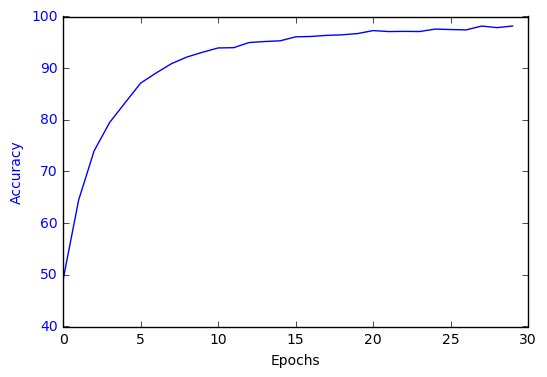

In [32]:
# plot the validation losses and accuracies for each epoch
fig, ax1 = plt.subplots()
e = np.arange(0, EPOCHS, 1)
ax1.set_xlabel('Epochs')
ax1.plot(e, np.multiply(val_accuracies,100),'b-')
ax1.set_ylabel('Accuracy', color='b')
for tl in ax1.get_yticklabels():
    tl.set_color('b')
plt.show()

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [33]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

In [34]:
X_predict=[]
y_predict=[]
for i in range(20):
    r = random.randrange(len(X_test_yuv))
    X_predict.append(X_test_yuv[r])
    y_predict.append(y_test[r])

predict_count=len(X_predict)
y_predict_df = pd.DataFrame(y_predict)
y_predict_df.columns=['id']

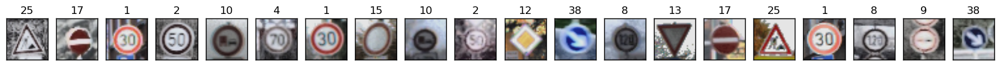

In [35]:
fig = plt.figure(figsize=(20, predict_count), dpi=200)

for i in range(predict_count):
    plt.subplot(1, predict_count, i+1)
    plt.title(y_predict_df.iloc[i].id)
    plt.imshow(X_predict[i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [36]:
print("Number of predictions: %d" % (len(X_predict)))

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, os.getcwd() + "/cnn-run")
    print("Model restored.")
   
    ps=sess.run(tf.argmax(logits,1),feed_dict={x:X_predict, keep_prob: 1.0})
    print ([(p,signnames_df.iloc[p].sign_name) for p in ps])

Number of predictions: 20
Model restored.
[(25, 'Road work'), (17, 'No entry'), (1, 'Speed limit (30km/h)'), (2, 'Speed limit (50km/h)'), (10, 'No passing for vehicles over 3.5 metric tons'), (4, 'Speed limit (70km/h)'), (1, 'Speed limit (30km/h)'), (15, 'No vehicles'), (10, 'No passing for vehicles over 3.5 metric tons'), (2, 'Speed limit (50km/h)'), (12, 'Priority road'), (38, 'Keep right'), (7, 'Speed limit (100km/h)'), (13, 'Yield'), (17, 'No entry'), (25, 'Road work'), (1, 'Speed limit (30km/h)'), (8, 'Speed limit (120km/h)'), (9, 'No passing'), (38, 'Keep right')]


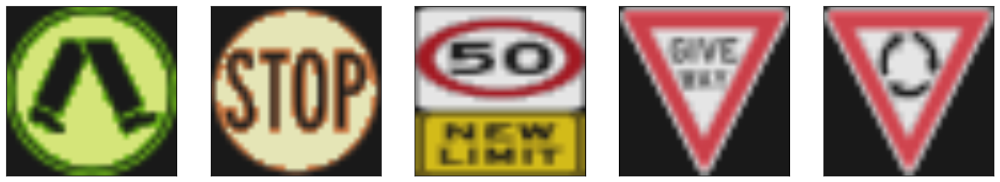

Number of predictions: 5
Model restored.
[(18, 'General caution'), (25, 'Road work'), (2, 'Speed limit (50km/h)'), (13, 'Yield'), (10, 'No passing for vehicles over 3.5 metric tons')]


In [37]:
#from os import scandir
from os.path import isfile, join
road_signs_path='./signs/'
def image_file(file):
    if (file.endswith('.jpg') or file.endswith('.png')):
         return True
    else: 
         return False

def load_image(path):
    img = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    return cv2.resize(img,(32,32), interpolation = cv2.INTER_AREA)
    
test_images=[load_image('./signs/' + f) for f in os.listdir('./signs/') if image_file(f)]


test_images=yuv_normalized(test_images)
test_image_count=len(test_images)

fig = plt.figure(figsize=(20, test_image_count), dpi=200)
for i in range(test_image_count):
    plt.subplot(1, test_image_count, i+1)
    plt.imshow(test_images[i])
    plt.xticks([]), plt.yticks([])
plt.show()

print("Number of predictions: %d" % (len(test_images)))

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, os.getcwd() + "/cnn-run")
    print("Model restored.")
   
    ps=sess.run(tf.argmax(logits,1),feed_dict={x:test_images, keep_prob: 1.0})
    print ([(p,signnames_df.iloc[p].sign_name) for p in ps])


In [38]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.

In [39]:
def softmax_image_explore(timage):
    with tf.Session() as sess:
        # Restore variables from disk.
        saver.restore(sess, os.getcwd() + "/cnn-run")
        print("Model restored.")
    
        image_logits=sess.run(logits,feed_dict={x:[timage], keep_prob: 1.0})
        print(image_logits)
            
        softmax=sess.run(tf.nn.softmax(image_logits))
        print(softmax)

        # experimented with softmax calculations 
        # per https://carnd-forums.udacity.com/questions/12619143/one-reason-for-low-accuracy-ill-conditioned-value-for-log-calculation
        # eventually realised I'd not normalised my captured test images 
        # - hence it was giving me large logit values
        image_logits -= np.max(image_logits)
        print(image_logits)

        predictions=sess.run(tf.nn.softmax(image_logits))
        print(predictions)

        probs = np.exp(image_logits) / np.sum(np.exp(image_logits))
        print(probs)

In [40]:
softmax_image_explore(X_test_yuv[1000])

Model restored.
[[ -67.71114349  -67.89704895 -103.44673157  -40.00569534  -82.19326782
   -87.28659821  -76.24737549  -98.91506958  -76.51125336    6.14056396
   -17.79649925  -37.73316574  -15.40748024  -18.84526062   36.61072159
   -27.16353226  -20.44683075   81.19271088  -33.83866119  -97.74181366
   -22.93864059  -57.85038376    8.52266407  -43.97907639 -127.4769516
   -28.51169777  -34.98764038 -146.78123474  -59.78889465  -58.83981323
   -68.48213196  -46.31291199  -36.389534    -29.24650383  -12.56931782
   -37.95837021  -62.56368637  -71.391716    -27.99486732  -73.2997818
   -89.67589569  -41.51264191  -67.55258179]]
[[  0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
    0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
    0.00000000e+00   2.54253385e-33   0.00000000e+00   0.00000000e+00
    0.00000000e+00   0.00000000e+00   4.34798506e-20   0.00000000e+00
    0.00000000e+00   1.00000000e+00   0.00000000e+00   0.00000000e+00
    0.00000000

In [41]:
softmax_image_explore(test_images[0])

Model restored.
[[-20.25992584 -11.967556   -23.82952118 -22.35046768  -3.36165094
  -19.44961929 -22.98726273 -23.05583382 -12.38031864 -22.30846977
  -24.02090454  -8.59210968 -11.1270771   -7.58936119 -13.82759953
   -6.49950457 -26.66454315 -15.01196289   4.68403816 -17.22969437
    3.97687387 -21.3031292   -1.88032484 -27.50314522  -4.39211559
   -1.60914707   3.61988974  -9.70854759  -8.33330822 -14.03515911
  -21.32021713 -17.33422089 -13.89943409 -16.97162437 -15.4794035
  -10.06354332  -8.13377285 -11.1267643   -5.23549652  -4.89069176
  -15.38571167 -18.08580017 -24.11864853]]
[[  7.97458193e-12   3.18447881e-08   2.24622038e-13   9.85818848e-13
    1.73994558e-04   1.79316215e-11   5.21483518e-13   4.86923273e-13
    2.10754774e-08   1.02810284e-12   1.85496448e-13   9.31056604e-07
    7.37995478e-08   2.53783992e-06   4.95714136e-09   7.54715256e-06
    1.31891848e-14   1.51659374e-09   5.42917490e-01   1.65089983e-10
    2.67680228e-01   2.80963859e-12   7.65362463e-04   5

In [42]:
from pylab import *
from matplotlib import gridspec
    
def topk_plot(test_images):
    with tf.Session() as sess:
        # Restore variables from disk.
        saver.restore(sess, os.getcwd() + "/cnn-run")
        print("Model restored.")
        softmax=tf.nn.softmax(logits)

        probs=sess.run(softmax,feed_dict={x:test_images, keep_prob: 1.0})

        (values,indices)=sess.run(tf.nn.top_k(probs, k = 5))
        print("top_k values, indices")
        print(values,indices)

    indices_names=np.array([signnames_df.iloc[i].sign_name for i in indices.reshape(25)])
    image_values=np.array([p for p in zip(indices_names,values.reshape(25))])

    image_values=image_values.reshape(5,5,2)

    pos = arange(5) + .5    # the bar centers on the y axis

    fig = plt.figure(figsize=(10,6))
    gs = gridspec.GridSpec(len(test_images),2,width_ratios=[1,5])

    for i in range(len(image_values)):
        values=[float(v[1]) for v in  image_values[i]]
        labels=[v[0] for v in image_values[i]]

        plt.subplot(gs[i*2])
        plt.imshow(test_images[i])
        plt.xticks([]), plt.yticks([])
        plt.subplot(gs[i*2+1])
        plt.tight_layout()
        barh(-pos,values, align='center')
        yticks(-pos, labels)
        xlabel('softmax probabilities')

    show()

Model restored.
top_k values, indices
[[  1.00000000e+00   2.70490137e-08   1.15510690e-09   5.82795895e-11
    4.96775518e-19]
 [  9.99999404e-01   4.50496032e-07   1.76277879e-07   2.75008821e-10
    1.66965435e-11]
 [  5.17798424e-01   3.16228151e-01   1.62224248e-01   3.70323542e-03
    3.71609167e-05]
 [  9.99999762e-01   2.86795000e-07   1.15253016e-08   1.59978853e-11
    1.24064734e-11]
 [  1.00000000e+00   6.92858548e-11   1.07955213e-14   1.30257330e-18
    1.06763671e-25]] [[ 1  4  0  2  8]
 [10  3  9  5  2]
 [ 8  5  3  7  2]
 [11 21 30 25 12]
 [33 35 39 37 38]]


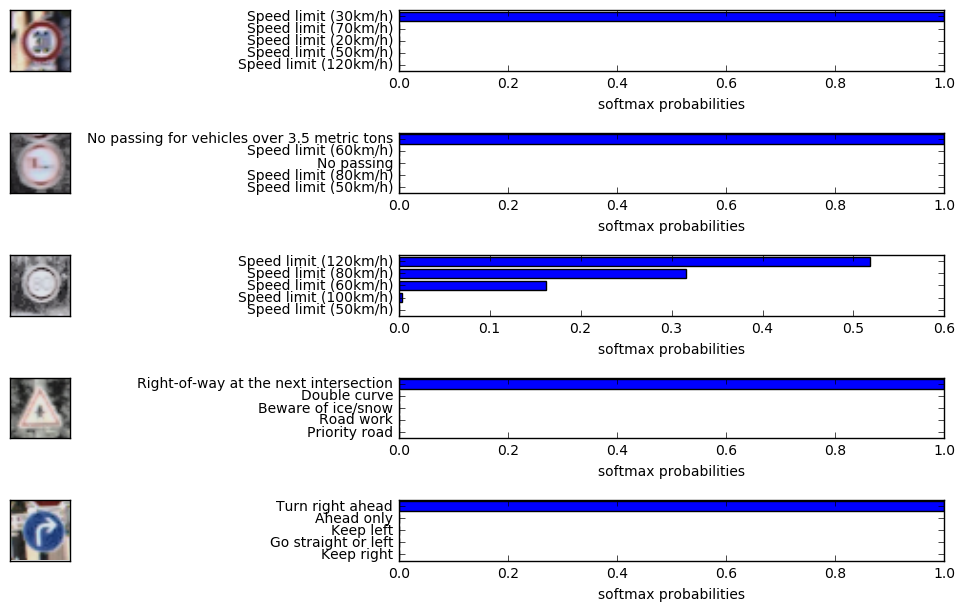

In [43]:
# plot top_k of 5 test images - for reference
topk_plot(X_test_yuv[100:105])

Model restored.
top_k values, indices
[[  5.42919695e-01   2.67678052e-01   1.87318146e-01   1.00377807e-03
    7.65360193e-04]
 [  9.99998689e-01   1.20044342e-06   6.82940993e-08   1.94817940e-08
    1.16329328e-08]
 [  3.64968866e-01   2.99942464e-01   2.03326762e-01   8.54954645e-02
    3.23556326e-02]
 [  9.99973059e-01   2.22938434e-05   3.74508249e-06   4.54510769e-07
    2.45797480e-07]
 [  6.32753909e-01   3.45925897e-01   2.04650778e-02   8.37265921e-04
    9.90164517e-06]] [[18 20 26 25 22]
 [25 13 11 21  2]
 [ 2  3  7  1  5]
 [13  4 15  1  9]
 [10  9 13 23  3]]


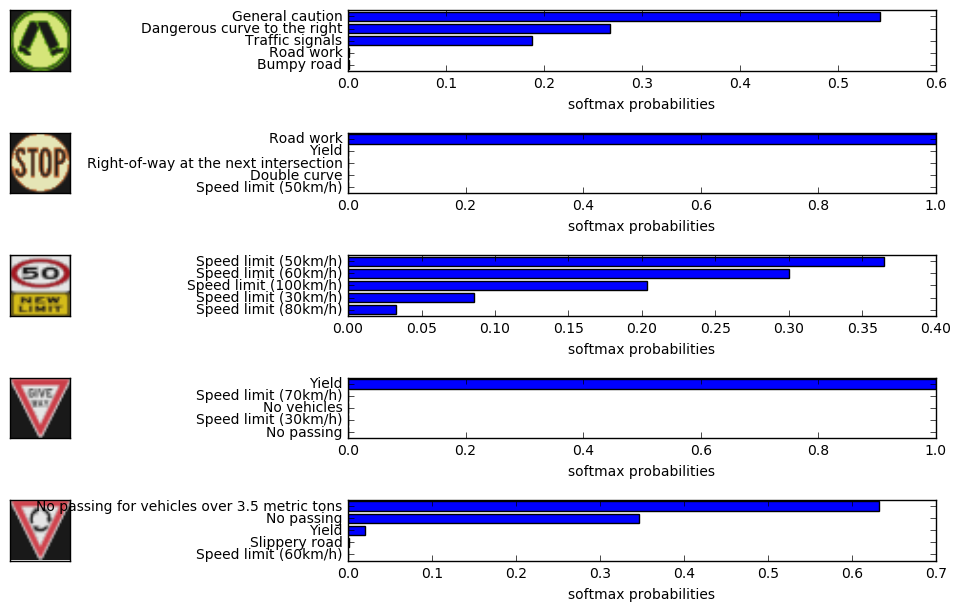

In [44]:
#plot top k of captured images
topk_plot(test_images)

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.